# Bayesian Analysis with Horse-Shoe Prior using CRRao.jl

## Outline

### Bayesian Poisson Regression

### Bayesian Logistic Regression

### Gaussian Process Models

### Future Works

## Bayesian Poisson Regression using Julia & CRRao.jl

+ Maximum Likelihood Methods
+ Ridge Prior
+ Laplace Prior
+ Cauchy Prior
+ T-Distributed Prior
+ Horse Shoe Prior

In [1]:
using CSV, DataFrames, CRRao
using Statistics;

### English Premier Leage data

+ 2020-21 data for **training**
+ 2021-22 data for **testing**


**Source**: https://www.football-data.co.uk/


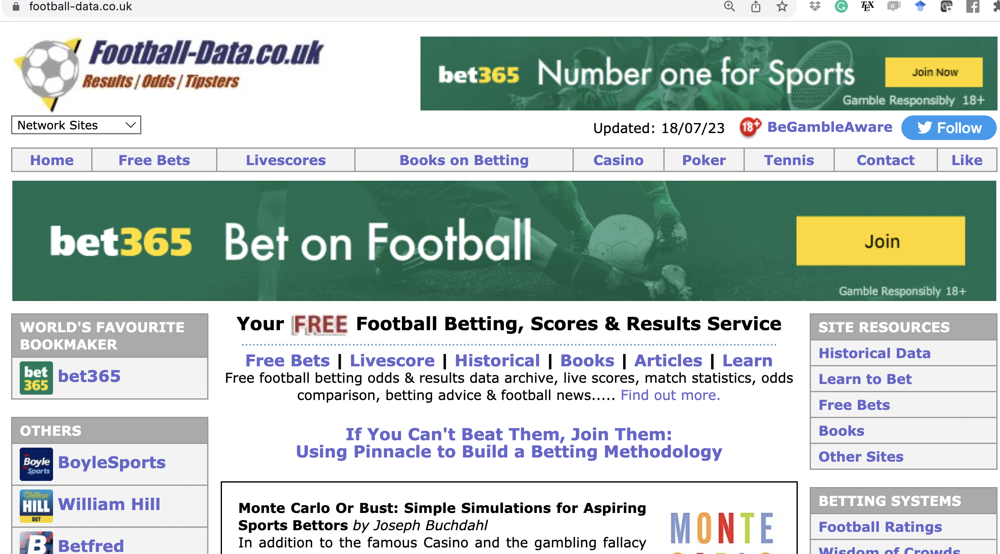


**Variable Definition**

FTHG and HG = Full Time Home Team Goals

FTAG and AG = Full Time Away Team Goals

FTR and Res = Full Time Result (H=Home Win, D=Draw, A=Away Win)

HTHG = Half Time Home Team Goals

HTAG = Half Time Away Team Goals

HTR = Half Time Result (H=Home Win, D=Draw, A=Away Win)

Attendance = Crowd Attendance


Referee = Match Referee

HS = Home Team Shots

AS = Away Team Shots

HST = Home Team Shots on Target

AST = Away Team Shots on Target

HHW = Home Team Hit Woodwork

AHW = Away Team Hit Woodwork

HC = Home Team Corners

AC = Away Team Corners

HF = Home Team Fouls Committed

AF = Away Team Fouls Committed

HFKC = Home Team Free Kicks Conceded

AFKC = Away Team Free Kicks Conceded

HO = Home Team Offsides

AO = Away Team Offsides

HY = Home Team Yellow Cards
AY = Away Team Yellow Cards
HR = Home Team Red Cards
AR = Away Team Red Cards
HBP = Home Team Bookings Points (10 = yellow, 25 = red)
ABP = Away Team Bookings Points (10 = yellow, 25 = red)

B365H = Bet365 home win odds
B365D = Bet365 draw odds
B365A = Bet365 away win odds
BSH = Blue Square home win odds
BSD = Blue Square draw odds
BSA = Blue Square away win odds

In [2]:
df_train = DataFrame(CSV.File("E0_20_21.csv"));
df_test = DataFrame(CSV.File("E0_21_22.csv"));

### **Model**

\begin{eqnarray}
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}

### **MLE Estimates**

In [3]:
using CRRao, StatsModels

mod1 = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A )
           ,df_train
           ,PoissonRegression())


Model Class: Poisson Regression
Likelihood Mode: Poison
Link Function: Log
Computing Method: Optimization
──────────────────────────────────────────────────────────────────────────────
                  Coef.  Std. Error      z  Pr(>|z|)    Lower 95%    Upper 95%
──────────────────────────────────────────────────────────────────────────────
(Intercept)  -0.352743    0.236089   -1.49    0.1351  -0.815468     0.109983
HS           -0.034822    0.0141776  -2.46    0.0140  -0.0626096   -0.00703447
AS           -0.023019    0.0139061  -1.66    0.0979  -0.0502744    0.00423639
HST           0.238636    0.0229936  10.38    <1e-24   0.193569     0.283703
AST           0.0255725   0.0271946   0.94    0.3470  -0.0277279    0.0788729
HC           -0.0438155   0.0186827  -2.35    0.0190  -0.0804331   -0.00719804
AC            0.0344269   0.0193173   1.78    0.0747  -0.00343431   0.0722882
B365H        -0.0248462   0.0300651  -0.83    0.4086  -0.0837727    0.0340803
B365A         0.0368102   0.0145

#### **Inference from Likelihood Analysis**

Following variables will have effect on **number of goals scored by home team**

1) HS : Number of shots taken by home team (positive)

2) HST: Number of shots on target taken by home team (positive)

3) HC : Numbe of corners by Home Team (negative)

4) B365A: Odds of Bet365 for Away team  (positive)

### **Bayesian Poisson Regression with Ridge Prior** 

\begin{eqnarray}
\lambda &\sim&  Inverse-Gamma(h, h)\\
\mathbf{\beta} &\sim& Normal_p(0, \lambda I)\\
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}


In [4]:
mod_ridge = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A)
                   ,df_train,PoissonRegression()
                   ,Prior_Ridge());


┌ Info: Found initial step size
└   ϵ = 7.888609052210118e-32
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:08


### **Bayesian Poisson Regression with Laplace Prior**

\begin{eqnarray}
\lambda &\sim&  Inverse-Gamma(h, h)\\
\mathbf{\beta_j} &\sim& Laplace(0, \lambda),~~j=1,2,\cdots,p\\
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}


In [5]:
mod_laplace = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A)
                   ,df_train,PoissonRegression()
                   ,Prior_Laplace());

┌ Info: Found initial step size
└   ϵ = 9.765625e-5
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:02


### **Bayesian Poisson Regression with Cauchy Prior** 

\begin{eqnarray}
\lambda &\sim&  Inverse-Gamma(h, h)\\
\mathbf{\beta_j} &\sim& t_1(\lambda),~~j=1,2,\cdots,p\\
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}


In [6]:
mod_Cauchy = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A)
                   ,df_train,PoissonRegression()
                   ,Prior_Cauchy());

┌ Info: Found initial step size
└   ϵ = 3.814697265625e-7
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:02


### **Bayesian Poisson Regression with TDistributed Prior** 

\begin{eqnarray}
\lambda &\sim&  Inverse-Gamma(h, h)\\
\nu &\sim& Inverse-Gamma(h, h)\\
\mathbf{\beta_j} &\sim& t_{\nu}(\lambda),~~j=1,2,\cdots,p\\
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}

In [7]:
mod_TDist = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A)
                   ,df_train,PoissonRegression()
                   ,Prior_TDist(),0.95,10000);

┌ Info: Found initial step size
└   ϵ = 1.52587890625e-6
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:15


### **Bayesian Poisson Regression with Horse Shoe Prior** 

\begin{eqnarray}
\tau &\sim&  Half-Cauchy(0, 1)\\
\lambda_j &\sim&  Half-Cauchy(0, 1),~~j=1,2,\cdots,p\\
\mathbf{\beta_j} &\sim& N(0,\lambda_j \tau),~~j=1,2,\cdots,p\\
\log(\mu_i) &=& X_i\beta \\
FTHG_i &\sim& Poisson(\mu_i),~~i=1,2,\cdots,n\\
\end{eqnarray}


In [8]:
mod_HS = fit(@formula(FTHG ~ HS + AS + HST + AST + HC + AC +B365H + B365A)
                   ,df_train,PoissonRegression()
                   ,Prior_HorseShoe(),10000);

┌ Info: Found initial step size
└   ϵ = 5.169878828456423e-27
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:43


In [9]:
show(mod_HS) 

Formula: FTHG ~ 1 + HS + AS + HST + AST + HC + AC + B365H + B365A
Link: CRRao.Identity(CRRao.Identity_Link)
Chain: Chains MCMC chain (10000×31×1 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 46.67 seconds
Compute duration  = 46.67 seconds
parameters        = τ, λ[1], λ[2], λ[3], λ[4], λ[5], λ[6], λ[7], λ[8], λ[9], β[1], β[2], β[3], β[4], β[5], β[6], β[7], β[8], β[9]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat   ess_per_sec 
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64       Float64 

           τ    0.0762    0.0555     0.0006    0.0013   1740.2688    0.9999       37.2888
        λ[1]    3.7083   22.9349     0.2293    0.5199   19

#### **Inference from Bayesian Poisson Regression with Poisson Regression**

Following variables will have effect on **number of goals scored by home team**

1) HS : Number of shots taken by home team (positive) *Same as likelihood anaysis*

2) HST: Number of shots on target taken by home team (positive) *Same as likelihood anaysis*

3) HC : Numbe of corners by Home Team (negative) *Same as likelihood anaysis*

4) B365A: Odds of Bet365 for Away team  (does not have effect) *In likelihood anaysis, B365A does have a positive effect*.

In [10]:
using StatsPlots
plot(mod_HS.chain)

In [11]:
mod_HS_small = fit(@formula(FTHG ~ HS + HST + HC)
                   ,df_train,PoissonRegression()
                   ,Prior_HorseShoe(),1000);

┌ Info: Found initial step size
└   ϵ = 0.00625
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:04


In [12]:
show(mod_HS_small)

Formula: FTHG ~ 1 + HS + HST + HC
Link: CRRao.Identity(CRRao.Identity_Link)
Chain: Chains MCMC chain (1000×21×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 8.06 seconds
Compute duration  = 8.06 seconds
parameters        = τ, λ[1], λ[2], λ[3], λ[4], β[1], β[2], β[3], β[4]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse        ess      rhat   ess_per_sec 
      Symbol   Float64   Float64    Float64   Float64    Float64   Float64       Float64 

           τ    0.3766    0.3339     0.0106    0.0146   356.2491    1.0106       44.1722
        λ[1]    2.7441    4.3129     0.1364    0.1530   525.9071    1.0005       65.2086
        λ[2]    0.5766    0.7935     0.0251    0.0257   719.9200    1.

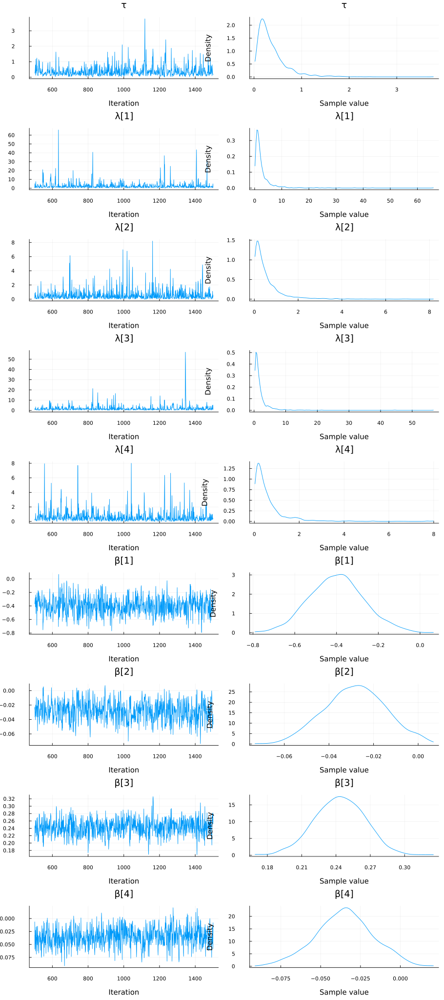

In [13]:
using StatsPlots
plot(mod_HS_small.chain)

In [14]:
pred_FTHG = predict(mod_HS_small,df_test); 

In [15]:
pred_FTHG

380-element Vector{Float64}:
 1.0349629054282103
 2.507524195658697
 0.7351000387414356
 1.6783121342812442
 1.5761415944587298
 1.4775884675465483
 2.3755929606698847
 0.8436100703315816
 0.6759575162376587
 0.8674218192152511
 2.119794500448983
 0.7407034541461744
 0.8070427348940235
 ⋮
 2.0623129972416367
 1.695815192506062
 1.9023825051161136
 1.370011942224746
 1.8566049641603997
 1.2243456309780496
 2.4692276333737744
 1.0598778963102622
 1.8501530463374118
 1.7543718244189663
 0.7384704523865225
 0.469565780645576

### Approximate R-Squared

In [16]:
cor(pred_FTHG,df_test.FTHG)^2

0.31783801843921905

### RMSE

In [17]:
sqrt(mean((pred_FTHG-df_test.FTHG).^2))

1.1400058276464422

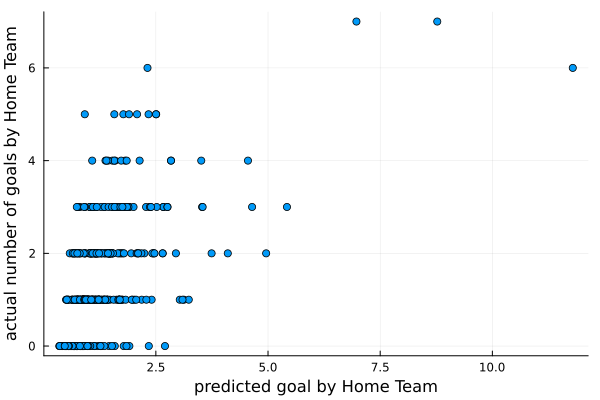

In [18]:
using Plots
scatter(pred_FTHG,df_test.FTHG,label="")
xlabel!("predicted goal by Home Team")
ylabel!("actual number of goals by Home Team")

## Logistic Regression Analysis of Friedreich Ataxia data

### **Source**

Liu JS, Sabatti C, Teng J, Keats BJB, Risch N (2001). Bayesian analysis of haplotypes for linkage disequilibrium mapping, **Genome Research** 11:1716-1724


In [11]:
using CRRao, RDatasets, StableRNGs, StatsModels

In [12]:
fa = dataset("gap", "fa");
first(fa,5)

Row,Y,Loci1,Loci2,Loci3,Loci4,Loci5,Loci6,Loci7,Loci8,Loci9,Loci10,Loci11,Loci12
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,2,7,8,2,5,9,2,2,2,2,6,3
2,1,3,7,8,2,5,9,2,2,2,2,6,3
3,1,3,1,8,2,5,9,2,2,2,2,14,5
4,1,2,5,7,2,5,9,2,2,2,2,14,3
5,1,14,7,8,5,6,2,3,2,2,2,14,9


In [13]:
using Random
MersenneTwister(4321);
function splitdf(df, pct)
    @assert 0 <= pct <= 1
    ids = collect(axes(df, 1))
    shuffle(ids)
    sel = ids .<= nrow(df) .* pct
    train = df[sel,:]
    test = df[.!sel, :] 
    return train, test
end

splitdf (generic function with 1 method)

In [14]:
train, test = splitdf(fa, 0.7); 

In [15]:
first(train,5)

Row,Y,Loci1,Loci2,Loci3,Loci4,Loci5,Loci6,Loci7,Loci8,Loci9,Loci10,Loci11,Loci12
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,2,7,8,2,5,9,2,2,2,2,6,3
2,1,3,7,8,2,5,9,2,2,2,2,6,3
3,1,3,1,8,2,5,9,2,2,2,2,14,5
4,1,2,5,7,2,5,9,2,2,2,2,14,3
5,1,14,7,8,5,6,2,3,2,2,2,14,9


In [16]:
first(test,5)

Row,Y,Loci1,Loci2,Loci3,Loci4,Loci5,Loci6,Loci7,Loci8,Loci9,Loci10,Loci11,Loci12
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,0,14,7,2,6,4,3,3,1,2,2,13,5
2,0,14,8,7,8,1,3,2,4,4,5,14,9
3,0,14,7,6,3,5,2,3,2,3,2,14,5
4,0,7,5,6,5,5,9,2,1,3,3,13,10
5,0,2,7,7,6,4,9,3,2,3,2,13,3


### **Maximum Likelihood Method**

In [17]:
mod_fa_MLE = fit(@formula(Y~Loci1+Loci2+Loci3+Loci4+Loci5+Loci6+Loci6+Loci7+Loci8+Loci9+Loci10+Loci11+Loci12)
                 ,train
                 ,LogisticRegression()
                 ,Logit())

Model Class: Logistic Regression
Likelihood Mode: Binomial
Link Function: Identity
Computing Method: Optimization
─────────────────────────────────────────────────────────────────────────────
                   Coef.  Std. Error      z  Pr(>|z|)   Lower 95%   Upper 95%
─────────────────────────────────────────────────────────────────────────────
(Intercept)  -0.622485     3.20291    -0.19    0.8459  -6.90007     5.6551
Loci1         0.0234339    0.0747286   0.31    0.7538  -0.123031    0.169899
Loci2        -0.272019     0.18217    -1.49    0.1354  -0.629065    0.0850266
Loci3         0.583014     0.251682    2.32    0.0205   0.0897263   1.0763
Loci4        -0.0697654    0.158738   -0.44    0.6603  -0.380886    0.241355
Loci5         0.204681     0.167822    1.22    0.2226  -0.124244    0.533606
Loci6         0.064064     0.10338     0.62    0.5355  -0.138557    0.266685
Loci7         0.821517     0.757082    1.09    0.2779  -0.662336    2.30537
Loci8        -0.113024     0.254904   -0

### Analysis

1) Loci 3 and Loci 12 are statistically siginifcant at 5% level

2) Loci 11 is significant at 10% level. !!

In [19]:
pred_mle = predict(mod_fa_MLE,test); 

In [21]:
using EvalMetrics
thres = 0.7;
predicts  = pred_mle .>= thres;
ConfusionMatrix(test.Y, predicts)
# p, n ,  tp, tn, fp, fn

ConfusionMatrix{Int64}(0, 39, 0, 29, 10, 0)

### **Bayesian Logistic Regression with Horse Shoe Prior** 

\begin{eqnarray}
\tau &\sim&  Half-Cauchy(0, 1)\\
\lambda_j &\sim&  Half-Cauchy(0, 1),~~j=1,2,\cdots,p\\
\mathbf{\beta_j} &\sim& N(0,\lambda_j \tau),~~j=1,2,\cdots,p\\
\mu_i &=& X_i\beta \\
p_i &=& logit(\mu_i)\\
y_i &\sim& Bernoulli(p_i),~~i=1,2,\cdots,n\\
\end{eqnarray}


In [27]:
mod_fa_HS = fit(@formula(Y~Loci1+Loci2+Loci3+Loci4+Loci5+Loci6+Loci6+Loci7+Loci8+Loci9+Loci10+Loci11+Loci12)
                 ,train
                 ,LogisticRegression()
                 ,Logit()
                 ,Prior_HorseShoe());

┌ Info: Found initial step size
└   ϵ = 0.025
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:24


In [23]:
show(mod_fa_HS)

Formula: Y ~ 1 + Loci1 + Loci2 + Loci3 + Loci4 + Loci5 + Loci6 + Loci7 + Loci8 + Loci9 + Loci10 + Loci11 + Loci12
Link: Logit(CRRao.Logit_Link)
Chain: Chains MCMC chain (1000×40×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 9.4 seconds
Compute duration  = 9.4 seconds
parameters        = τ, λ[1], λ[2], λ[3], λ[4], λ[5], λ[6], λ[7], λ[8], λ[9], λ[10], λ[11], λ[12], λ[13], σ, β[1], β[2], β[3], β[4], β[5], β[6], β[7], β[8], β[9], β[10], β[11], β[12], β[13]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std   naive_se      mcse       ess      rhat   ess_per_sec 
      Symbol    Float64   Float64    Float64   Float64   Float64   Float64       Float64 

           τ     6.3493    0.0812     0.0026    0.0143    2.226

In [28]:
plot(mod_fa_HS.chain)

## Gaussian Process Regression

In [29]:
using GaussianProcesses
struct GaussianProcessesRegression
end
function fit_GP(formula::FormulaTerm,
        data::DataFrame,
        modelClass::GaussianProcessesRegression)
    
    ## Default it will use optim with mean constant and squared error exponential kernel

    formula = apply_schema(formula, schema(formula, data), RegressionModel)
    y, X = modelcols(formula, data);
    
    mZero = MeanZero()
    
    kern = Matern(5/2,[0.0,0.0],0.0) + SE(0.1,0.1)
    
    logObsNoise = -1.0
    gp = GP(X', y, mZero, kern, logObsNoise)
    optimize!(gp; method=ConjugateGradient())
    
    return gp
    
    
end


fit_GP (generic function with 1 method)

In [30]:
using CRRao, RDatasets, StatsModels, Optim
df = dataset("datasets", "mtcars")
model = fit_GP(@formula(MPG ~-1+ WT),df,GaussianProcessesRegression());

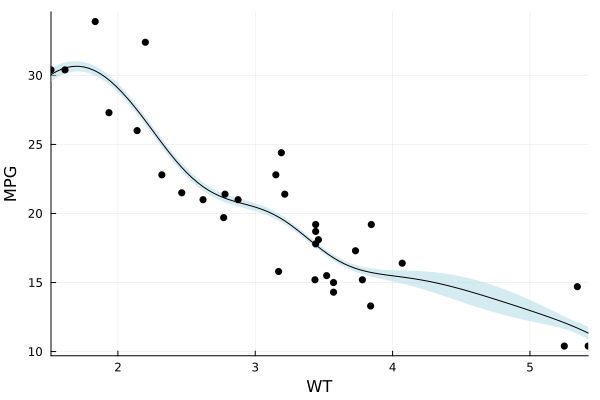

In [31]:
plot(model,label="")
xlabel!("WT")
ylabel!("MPG")

## Furure Work

### ARIMA 

### K-means clustering

### Mixwd Models

### Step wise selection, Variance Inflation Factor

### Bartlet's Rank Test

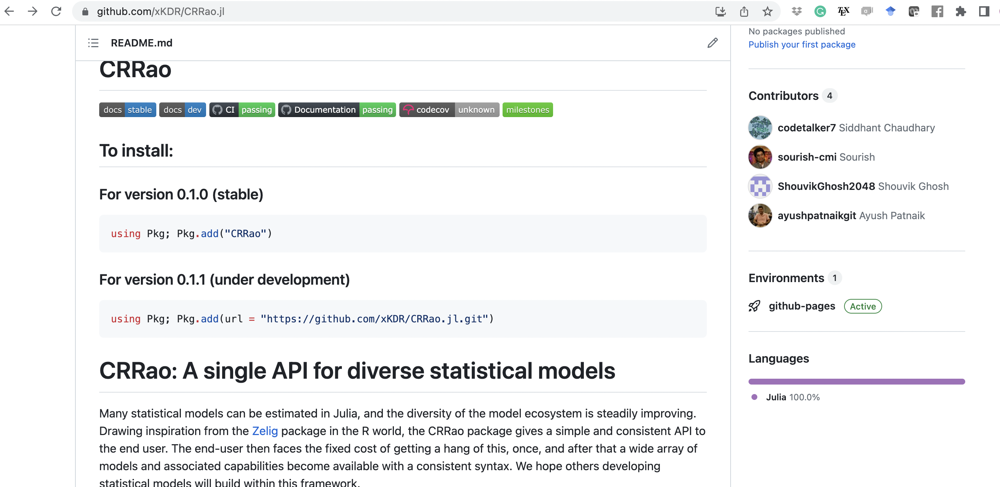

### CRRao GitHub Page : https://github.com/xKDR/CRRao.jl

## Thank You
### sourish@cmi.ac.in